### IMEC2543 - DINAMICA DE MAQUINARIA
### [Luis Alejandro Rodríguez Arenas](https://luigitoby.github.io/) Cod. 202321287
# Taller 1

In [361]:
import numpy as np
from numpy import deg2rad, rad2deg
from sympy import symbols, pi, sin, cos, lambdify, solve, linear_eq_to_matrix, simplify, acos, sqrt, rad
import sympy as sp
from sympy.physics.mechanics import ReferenceFrame, dynamicsymbols, express
from scipy import optimize
from scipy.optimize import fsolve
from scipy.optimize import minimize
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

### Nota: Todos los recursos para esta actividad se pueden encontrar en el siguiente github, hay cosas que no adjunte como imagenes adicionales y mediciones que se encuentran aquí: https://github.com/LuigiToby/IMEC2543/tree/main/talleres/taller1

# Paso -1 - Hacer los dibujos y diagramas necesarios


Para la realización de este trabajo se desarrollaron todos los diagramas de cuerpo libre (DCL), así como anotaciones detalladas del mecanismo, su respectivo grafo y el proceso metodológico necesario para resolver cada uno de los ítems planteados. Estos desarrollos se incluyen en el presente documento; adicionalmente, se adjunta un archivo PDF (https://github.com/LuigiToby/IMEC2543/blob/main/talleres/taller1/LuisRodriguez_taller1_diagramas.pdf) independiente con los mismos diagramas y procedimientos con el fin de facilitar su visualización y revisión detallada.

En términos de estimación de parámetros geométricos, las piezas fueron medidas físicamente. Para este propósito se imprimió el robot en 3D, lo cual permitió obtener dimensiones reales del sistema. Posteriormente, estas medidas fueron cotejadas en Fusion 360 utilizando la herramienta de *Calcar Sketch*, con el fin de validar y ajustar las cotas del modelo digital. Las imágenes asociadas a este proceso se encuentran disponibles en el repositorio oficial del curso, en la carpeta `taller1/cotas`, en el siguiente enlace:

[https://github.com/LuigiToby/IMEC2543/tree/main/talleres/taller1](https://github.com/LuigiToby/IMEC2543/tree/main/talleres/taller1)

Aprovechando la impresión física de las piezas, se utilizó también el proceso de *slicing* para determinar las masas individuales de cada componente, considerando la configuración real de impresión. Estos valores se encuentran igualmente documentados en el repositorio, en la carpeta `taller1/pesos`.

En cuanto a la determinación de los centros de masa y los momentos de inercia, se adoptó una aproximación geométrica ubicando los centros en la mitad de las piezas y modelando los cuerpos como barras delgadas o triángulos delgados cuando era pertinente. Esta decisión se fundamenta en las siguientes consideraciones:

1. El análisis geométrico realizado en Fusion 360 evidenció que varios de los cuerpos pueden aproximarse razonablemente como elementos delgados. Esta simplificación se hace aún más evidente al comparar la geometría real con la obtenida en el *slicer*.

2. Al contrastar resultados preliminares, se observó que los errores introducidos por esta aproximación eran pequeños. Dado que estas diferencias afectan únicamente la etapa de dinámica inversa, se consideró que no justificaban un modelado más complejo.

3. Se analizaron alternativas implementadas por otros compañeros que calcularon centros de masa y momentos de inercia directamente en Fusion 360. Sin embargo, debido a la naturaleza de la impresión 3D (configuración de *infill*, densidad interna y parámetros de manufactura), cualquier cálculo basado exclusivamente en el modelo sólido resulta inherentemente inexacto. Estas variaciones afectan tanto la ubicación real del centro de masa como los momentos de inercia. En consecuencia, incluso invirtiendo mayor tiempo en este procedimiento, persistiría un error estructural significativo, por lo que se descartó esta opción.

Adicionalmente, para facilitar el análisis cinemático y dinámico del sistema, se emplearon ángulos globales medidos respecto a un marco de referencia inercial fijo. Esta elección simplifica la formulación de las ecuaciones de movimiento, evita ambigüedades asociadas a ángulos relativos encadenados y permite expresar directamente las velocidades y aceleraciones como:

$$
\omega_i = \dot{\theta}_i
$$

$$
\alpha_i = \ddot{\theta}_i
$$

donde $$\theta_i$$ representa el ángulo absoluto de cada eslabón respecto al marco global.

Con base en las simplificaciones, alcances y restricciones anteriormente descritas, se presenta el siguiente modelo cinemático y dinámico para el análisis planar del EEZYbotARM.

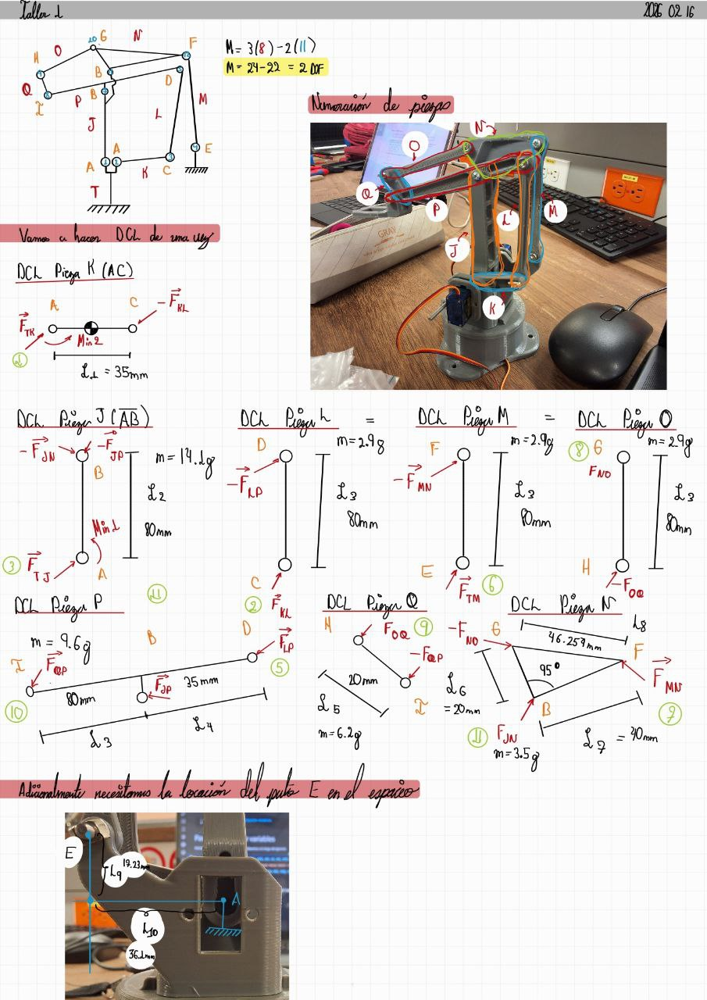
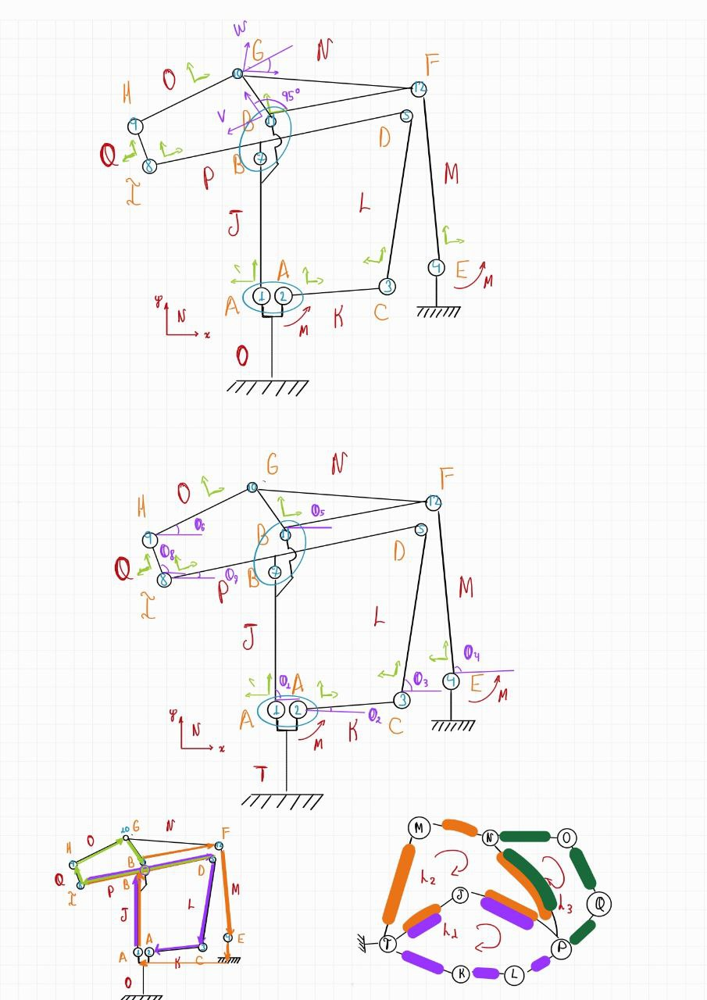
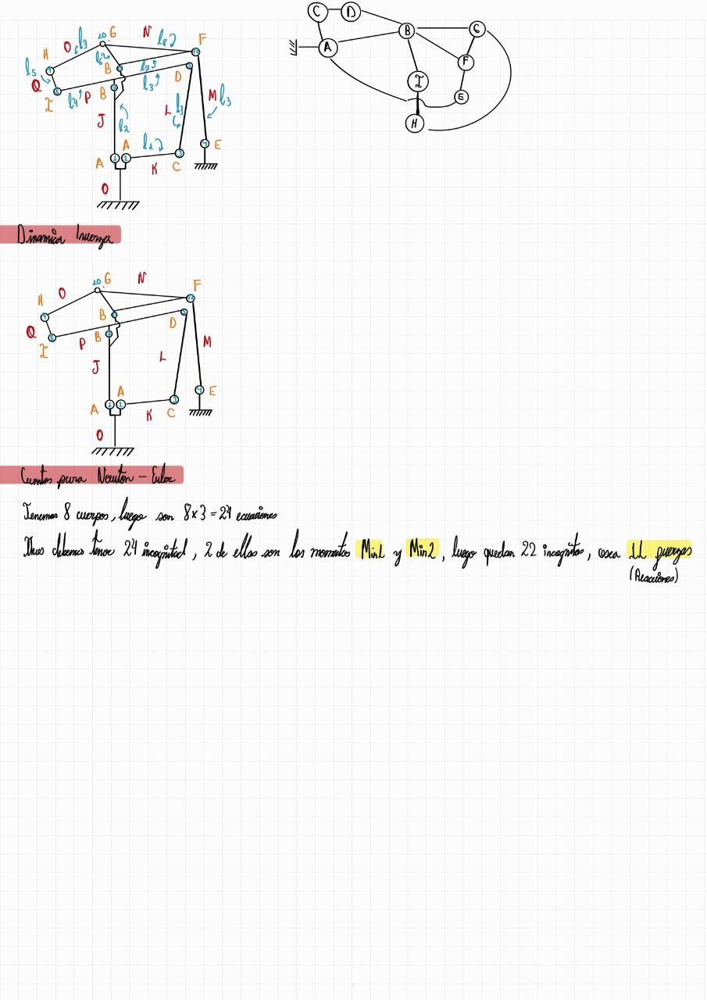

# Paso 0 -  Establecer variables
Vamos a establecer las variables que necesitaremos a lo largo del ejercicio

In [362]:
l1, l2, l3, l4, l5, l6, l7, l8, l9, l10, mJ, mK, mL, mM, mN, mO, mP, mQ, g, t = symbols('l1 l2 l3 l4 l5 l6 l7 l8 l9 l10 mJ mK mL mM mN mO mP mQ g t')

theta1, theta2, theta3, theta4, theta5, theta6, theta7, theta8 = dynamicsymbols('theta1 theta2 theta3 theta4 theta5 theta6 theta7 theta8')


# ---- Cuerpo K ----
F_TKx, F_TKy, M_in2 = symbols('F_TKx F_TKy M_in2')

# ---- Cuerpo J ----
F_TJx, F_TJy, M_in1 = symbols('F_TJx F_TJy M_in1')

# ---- Cuerpo L ----
F_KLx, F_KLy = symbols('F_KLx F_KLy')

# ---- Cuerpo M ----
F_TMx, F_TMy = symbols('F_TMx F_TMy')

# ---- Cuerpo O ----
F_NOx, F_NOy = symbols('F_NOx F_NOy')

# ---- Cuerpo P ----
F_QPx, F_QPy = symbols('F_QPx F_QPy')
F_JPx, F_JPy = symbols('F_JPx F_JPy')
F_LPx, F_LPy = symbols('F_LPx F_LPy')

# ---- Cuerpo Q ----
F_OQx, F_OQy = symbols('F_OQx F_OQy')

# ---- Cuerpo N ----
F_JNx, F_JNy = symbols('F_JNx F_JNy')
F_MNx, F_MNy = symbols('F_MNx F_MNy')


params={l1: 0.035, l2: 0.08, l3: 0.08, l4: 0.035, l5: 0.02, l6: 0.02, l7: 0.04, l8: 0.046254, l9: 0.01723, l10: 0.0361, mJ: 0.0141, mK: 0.0029, mL: 0.0029, mM: 0.0029, mN: 0.0035, mO: 0.0029, mP: 0.0096, mQ: 0.0062, g: 9.81}

T=ReferenceFrame('T')

J=T.orientnew('J','Axis',(theta1,T.z))
K=T.orientnew('K','Axis',(theta2,T.z))
L=T.orientnew('L','Axis',(theta3,T.z))
M=T.orientnew('M','Axis',(theta4,T.z))
N=T.orientnew('N','Axis',(theta5,T.z))
O=T.orientnew('O','Axis',(theta6,T.z))
P=T.orientnew('P','Axis',(theta7,T.z))
Q=T.orientnew('Q','Axis',(theta8,T.z))

# V=N.orientnew('V','Axis',(95*pi/180,N.z))
# rBG = l6*V.x

rBG = l6*(cos(95*pi/180)*N.x + sin(95*pi/180)*N.y)

# W=N.orientnew('W','Axis',(-deg2rad(25.515),N.z))

rAB = l2*J.x
rAC = l1*K.x
rCD = l3*L.x
############
rBD = l4*P.x
rIB = l3*P.x
############
rIH = l5*Q.x
rHG = l3*O.x
############
rBF = l7*N.x
# rGF = l8*W.x
##########
rEF = l3*M.x
rAE = l10*T.x+l9*T.y

eqLoop1 = rAB+rBD-rCD-rAC
eqLoop2 = rAB+rBF-rEF-rAE
eqLoop3 = -rIB+rIH+rHG-rBG

eqLoop1 = eqLoop1.subs(params)
eqLoop2 = eqLoop2.subs(params)
eqLoop3 = eqLoop3.subs(params)

### Pequeño código para verificar gráficamente que los loops cierran

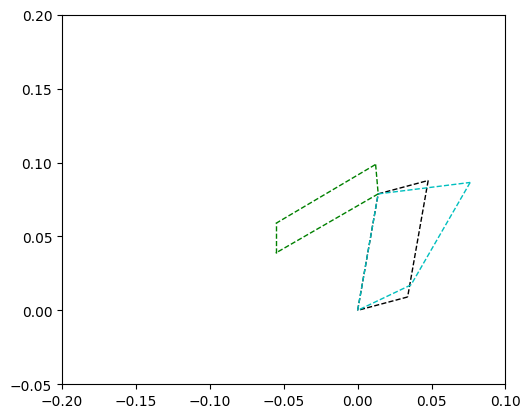

In [363]:
points={'A': 0*T.x, 'B': rAB, 'C': rAC, 'D': rAC+rCD, 'E': rAE, 'F': rAE+rEF, 'G': rAB+rBG, 'H': rAB-rIB+rIH, 'I': rAB-rIB}
points_fun={k:lambdify([theta1,theta2,theta3,theta4,theta5,theta6,theta7,theta8],[v.dot(T.x).subs(params),v.dot(T.y).subs(params)]) for k,v in points.items()}

def plotMechanism(joint_values,ax=None):    
    A=points_fun['A'](*joint_values) # Operador de unpacking, es decir, toma la lista de joint_values y los pasa como argumentos a la función de cada punto
    B=points_fun['B'](*joint_values)
    C=points_fun['C'](*joint_values)
    D=points_fun['D'](*joint_values)
    E=points_fun['E'](*joint_values)
    F=points_fun['F'](*joint_values)
    G=points_fun['G'](*joint_values)
    H=points_fun['H'](*joint_values)
    I=points_fun['I'](*joint_values)    

    if ax is None:
        ax=plt.figure().add_subplot(111)
        # -------- DRAW LOOP 1 --------
    # A -> B -> D -> C -> A
    ax.plot([A[0], B[0]], [A[1], B[1]], 'k--', linewidth=1)
    ax.plot([B[0], D[0]], [B[1], D[1]], 'k--', linewidth=1)
    ax.plot([D[0], C[0]], [D[1], C[1]], 'k--', linewidth=1)
    ax.plot([C[0], A[0]], [C[1], A[1]], 'k--', linewidth=1)

    # -------- DRAW LOOP 2 --------
    # A -> B -> F -> E -> A
    ax.plot([A[0], B[0]], [A[1], B[1]], 'c--', linewidth=1)
    ax.plot([B[0], F[0]], [B[1], F[1]], 'c--', linewidth=1)
    ax.plot([F[0], E[0]], [F[1], E[1]], 'c--', linewidth=1)
    ax.plot([E[0], A[0]], [E[1], A[1]], 'c--', linewidth=1)

    # -------- DRAW LOOP 3 --------
    # B -> I -> H -> G -> B
    ax.plot([B[0], I[0]], [B[1], I[1]], 'g--', linewidth=1)
    ax.plot([I[0], H[0]], [I[1], H[1]], 'g--', linewidth=1)
    ax.plot([H[0], G[0]], [H[1], G[1]], 'g--', linewidth=1)
    ax.plot([G[0], B[0]], [G[1], B[1]], 'g--', linewidth=1)

    ax.set_aspect('equal')
    ax.set_xlim(-0.2,0.1)
    ax.set_ylim(-0.05,0.2)

# Chekeo rápido para ver si funciona la función de plot
plotMechanism([np.deg2rad(80),np.deg2rad(15),np.deg2rad(80),np.deg2rad(60),np.deg2rad(0),np.deg2rad(30),np.deg2rad(30),np.deg2rad(90)])


In [364]:
# Verificación del ángulo constante
BF = rBF.subs(params)
BG = rBG.subs(params)

angle = acos(
    (BF.dot(BG)) / (sqrt(BF.dot(BF)) * sqrt(BG.dot(BG)))
)

angle = simplify(angle)

display(angle)

rad2deg(float(angle))

acos(-1.0*sin(pi/36))

np.float64(95.0)

In [365]:
eqs = [
    eqLoop1.dot(T.x),
    eqLoop1.dot(T.y),
    eqLoop2.dot(T.x),
    eqLoop2.dot(T.y),
    eqLoop3.dot(T.x),
    eqLoop3.dot(T.y)
]

eqs_fun = lambdify(
    (theta1, theta2, theta3, theta4, theta5, theta6, theta7, theta8),
    eqs,
    modules="numpy"
)

# Paso 1  - FK
Como hemos visto en clase el paso 1 es realizar el FK del mecanísmo, pues este nos permitirá en el futuro determinar la posición final del efector daondole los valores de valores de $\theta$, $\dot{\theta}$ y $\dot{\theta}$ 

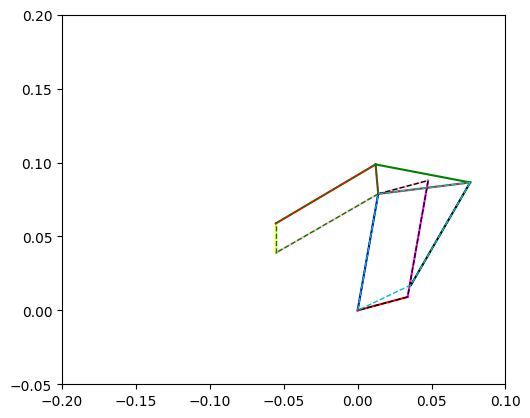

In [366]:
points={'A': 0*T.x, 'B': rAB, 'C': rAC, 'D': rAC+rCD, 'E': rAE, 'F': rAE+rEF, 'G': rAB+rBG, 'H': rAB-rIB+rIH, 'I': rAB-rIB}
points_fun={k:lambdify([theta1,theta2,theta3,theta4,theta5,theta6,theta7,theta8],[v.dot(T.x).subs(params),v.dot(T.y).subs(params)]) for k,v in points.items()}

def plotMechanism(joint_values,ax=None):    
    A=points_fun['A'](*joint_values) # Operador de unpacking, es decir, toma la lista de joint_values y los pasa como argumentos a la función de cada punto
    B=points_fun['B'](*joint_values)
    C=points_fun['C'](*joint_values)
    D=points_fun['D'](*joint_values)
    E=points_fun['E'](*joint_values)
    F=points_fun['F'](*joint_values)
    G=points_fun['G'](*joint_values)
    H=points_fun['H'](*joint_values)
    I=points_fun['I'](*joint_values)    

    if ax is None:
        ax=plt.figure().add_subplot(111)
    ax.plot([A[0],B[0]], [A[1],B[1]], 'BLUE')
    ax.plot([A[0],C[0]], [A[1],C[1]], 'red')
    ax.plot([C[0],D[0]], [C[1],D[1]], 'magenta')
    ax.plot([B[0],D[0]], [B[1],D[1]], 'pink')
    ax.plot([B[0],I[0]], [B[1],I[1]], 'pink')
    ax.plot([I[0],H[0]], [I[1],H[1]], 'yellow')
    ax.plot([H[0],G[0]], [H[1],G[1]], 'red')
    ax.plot([B[0],G[0]], [B[1],G[1]], 'brown')
    ax.plot([E[0],F[0]], [E[1],F[1]], 'black') 
    ax.plot([B[0],F[0]], [B[1],F[1]], 'brown')
    ax.plot([G[0],F[0]], [G[1],F[1]], 'green')
    
        # -------- DRAW LOOP 1 --------
    # A -> B -> D -> C -> A
    ax.plot([A[0], B[0]], [A[1], B[1]], 'k--', linewidth=1)
    ax.plot([B[0], D[0]], [B[1], D[1]], 'k--', linewidth=1)
    ax.plot([D[0], C[0]], [D[1], C[1]], 'k--', linewidth=1)
    ax.plot([C[0], A[0]], [C[1], A[1]], 'k--', linewidth=1)

    # -------- DRAW LOOP 2 --------
    # A -> B -> F -> E -> A
    ax.plot([A[0], B[0]], [A[1], B[1]], 'c--', linewidth=1)
    ax.plot([B[0], F[0]], [B[1], F[1]], 'c--', linewidth=1)
    ax.plot([F[0], E[0]], [F[1], E[1]], 'c--', linewidth=1)
    ax.plot([E[0], A[0]], [E[1], A[1]], 'c--', linewidth=1)

    # -------- DRAW LOOP 3 --------
    # B -> I -> H -> G -> B
    ax.plot([B[0], I[0]], [B[1], I[1]], 'g--', linewidth=1)
    ax.plot([I[0], H[0]], [I[1], H[1]], 'g--', linewidth=1)
    ax.plot([H[0], G[0]], [H[1], G[1]], 'g--', linewidth=1)
    ax.plot([G[0], B[0]], [G[1], B[1]], 'g--', linewidth=1)

    ax.set_aspect('equal')
    ax.set_xlim(-0.2,0.1)
    ax.set_ylim(-0.05,0.2)

# Chekeo rápido para ver si funciona la función de plot
plotMechanism([np.deg2rad(80),np.deg2rad(15),np.deg2rad(80),np.deg2rad(60),np.deg2rad(0),np.deg2rad(30),np.deg2rad(30),np.deg2rad(90)])


### Nota sobre el dibujo de arriba
En este las proporciones estan locas porque puse los angulos a ojo para ver cual podría ser un buen first guess, entonces que no cunda el pánico.

In [367]:
def FK(theta1_val, theta2_val, guess):
    """
    Resuelve la cinemática directa encontrando los ángulos desconocidos
    que minimizan el error de cierre geométrico.
    
    theta1_val, theta2_val  -> DOF impuestos
    guess                   -> estimación inicial de [theta3,...,theta8]
    """

    # -------------------------------------------------
    # 1) Definimos el RESIDUAL (error geométrico)
    # -------------------------------------------------
    def residual(theta_u):
        theta3, theta4, theta5, theta6, theta7, theta8 = theta_u
        
        r = eqs_fun(
            theta1_val,
            theta2_val,
            theta3,
            theta4,
            theta5,
            theta6,
            theta7,
            theta8
        )
        
        return np.array(r, dtype=float)

    # -------------------------------------------------
    # 2) Definimos el COSTO escalar = ||r||^2
    # -------------------------------------------------
    def cost(theta_u):
        r = residual(theta_u)
        return np.dot(r, r)   # suma de cuadrados

    # -------------------------------------------------
    # 3) Minimizamos el costo
    # -------------------------------------------------
    result = minimize(
        cost,
        x0=guess,
        method='BFGS',
        options={
            'maxiter': 10000,
            'gtol': 1e-8,
            'disp': True   # para VER la iteración
        }
    )

    # -------------------------------------------------
    # 4) Verificamos convergencia
    # -------------------------------------------------
    if not result.success:
        print("No convergió.")
        print("Costo final:", result.fun)
        raise RuntimeError(result.message)

    print("Convergió.")
    print("Costo final:", result.fun)
    print("Norma residual:", np.sqrt(result.fun))

    return result.x

Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 58
         Function evaluations: 427
         Gradient evaluations: 61
Convergió.
Costo final: 1.1490557084578439e-14
Norma residual: 1.0719401608568661e-07


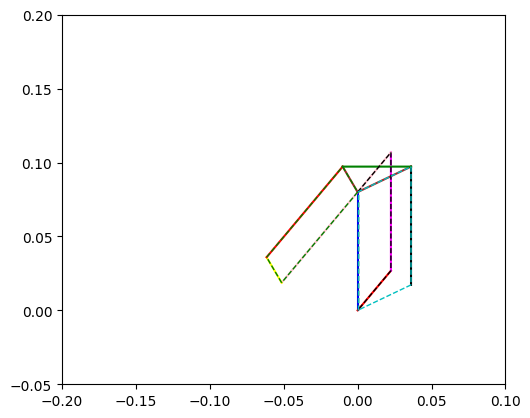

In [368]:
theta1_val = np.deg2rad(90)
theta2_val = np.deg2rad(50)

guess = [
    np.deg2rad(30),
    np.deg2rad(30),
    np.deg2rad(30),
    np.deg2rad(30),
    np.deg2rad(30),
    np.deg2rad(90)
]

theta_u_sol = FK(theta1_val, theta2_val, guess)

joint_values = [theta1_val, theta2_val, *theta_u_sol]
plotMechanism(joint_values)
plt.show()

# Paso 1.1  - Animación del mecanismo
Ahora que tenemos un código sólido donde es claro que el mecanismo cierra, ¡Podemos proceder a animarlo!

In [369]:
theta1_min = rad(90)
theta1_max = rad(160)
theta2_min = rad(0)
theta2_max = rad(90)

In [370]:
tList = np.linspace(0, 2*np.pi, 120)

# Nota importante sobre las animaciones
Entonces esta animación 1 y animación 2. La animación 1 es más interesante pues lo mueve en ambos grados de libertad al mismo tiempo. Pero la animación 2 sirve para identifica en el ID que en efecto el momento requeridos es como una función sinosoidal, es fácil verificar el modelo así. Ahora para usar animación 1 aparte de comentar animación 1 hay que quitar el OVERRIDE de las derivadas pues estas dan 0 para el ángulo que dejamos quieto. Por default dejare la animación 2 en el notebook, y dejaré un .gif y .mp4 en la carpeta de github de la animación2

In [371]:
# Animación 1
theta1_sym = theta1_min + (theta1_max - theta1_min) * sp.Rational(1,2) * (1 - sp.cos(sp.Rational(1,2)*t))
theta2_sym = theta2_min + (theta2_max - theta2_min) * sp.Rational(1,2) * (1 - sp.cos(t))

Sería comentar esto de abajo y el OVERRIDE de las derivadas y ya tienes la animación1 :D

In [372]:
# Animación 2
theta1_sym = pi/2 + (pi/18) * sin((2*sp.pi/3)*t)
theta2_sym = 0

In [373]:
theta1_dot_sym  = sp.diff(theta1_sym, t)
theta1_ddot_sym = sp.diff(theta1_dot_sym, t)

theta2_dot_sym  = sp.diff(theta2_sym, t)
theta2_ddot_sym = sp.diff(theta2_dot_sym, t)

In [374]:
theta1_fun      = sp.lambdify(t, theta1_sym, 'numpy')
theta1_dot_fun  = sp.lambdify(t, theta1_dot_sym, 'numpy')
theta1_ddot_fun = sp.lambdify(t, theta1_ddot_sym, 'numpy')

theta2_fun      = sp.lambdify(t, theta2_sym, 'numpy')
theta2_dot_fun  = sp.lambdify(t, theta2_dot_sym, 'numpy')
theta2_ddot_fun = sp.lambdify(t, theta2_ddot_sym, 'numpy')

In [375]:
theta1_vals = theta1_fun(tList)
theta2_vals = theta2_fun(tList)

theta1_dot_vals  = theta1_dot_fun(tList)
theta1_ddot_vals = theta1_ddot_fun(tList)

theta2_dot_vals  = theta2_dot_fun(tList)
theta2_ddot_vals = theta2_ddot_fun(tList)

# AQUÍ ESTA EL OVERRIDE PARA ANIMACIÓN 2

In [376]:
theta2_vals = np.zeros_like(tList) # <- Override para comparar con animación 2
theta2_dot_vals  = np.zeros_like(tList)
theta2_ddot_vals = np.zeros_like(tList)

In [377]:
theta_u_hist = []

theta_u0 = np.deg2rad([80, 60, 0, 30, 30, 90])

for i in range(len(tList)):

    theta1_val = theta1_vals[i]
    theta2_val = theta2_vals[i]

    theta_u_sol = FK(theta1_val, theta2_val, theta_u0)

    theta_u_hist.append(theta_u_sol)
    theta_u0 = theta_u_sol   # continuation

Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 58
         Function evaluations: 427
         Gradient evaluations: 61
Convergió.
Costo final: 3.0210613693857883e-16
Norma residual: 1.738120067597687e-08
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 51
         Function evaluations: 392
         Gradient evaluations: 56
Convergió.
Costo final: 2.9019978965478755e-15
Norma residual: 5.387019488128733e-08
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 50
         Function evaluations: 385
         Gradient evaluations: 55
Convergió.
Costo final: 7.180429605432205e-14
Norma residual: 2.679632363857439e-07
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 50
         Function evaluations: 385
         Gradient evaluations: 55
Convergió.
Costo final: 6.90146492029392e-14
Norma res

In [378]:
np.max(np.abs(theta_u_hist))

np.float64(2.103412764352872)

In [379]:
theta_u_vals = np.array(theta_u_hist)

print("Máximo residual FK:", 
      np.max([
          np.linalg.norm(eqs_fun(theta1_vals[i], theta2_vals[i], *theta_u_vals[i]))
          for i in range(len(tList))
      ]))

Máximo residual FK: 3.8826339302237955e-07


In [380]:
def plotMechanismTrans2(joint_values, ax=None):
    
    if ax is None:
        ax = plt.figure().add_subplot(111)

    # 1️⃣ Dibujar mecanismo normal
    plotMechanism(joint_values, ax)

    A = np.array(points_fun['A'](*joint_values))
    B = np.array(points_fun['B'](*joint_values))
    D = np.array(points_fun['D'](*joint_values))
    # 3️⃣ Calcular vectores en la unión del servo
    BA = A - B
    BD = D - B

    ang_BA = np.arctan2(BA[1], BA[0])
    ang_BD = np.arctan2(BD[1], BD[0])

    # Diferencia angular firmada (clave para que no salte)
    delta = np.arctan2(
        np.sin(ang_BD - ang_BA),
        np.cos(ang_BD - ang_BA)
    )

    mu = abs(delta)
    mu_deg = np.degrees(mu)

    # 4️⃣ Dibujar arco
    from matplotlib.patches import Arc

    arc_radius = 0.025

    arc = Arc(
        B,
        width=2*arc_radius,
        height=2*arc_radius,
        angle=0,
        theta1=np.degrees(ang_BA),
        theta2=np.degrees(ang_BA + delta),
        color='blue',
        linewidth=2
    )

    ax.add_patch(arc)

    # 5️⃣ Mostrar valor en grados
    ax.text(
        B[0] + 0.01,
        B[1] + 0.01,
        rf"$\mu_1={mu_deg:.1f}^\circ$",
        color='blue',
        fontsize=10
    )

    return mu_deg

In [381]:
def plotMechanismTrans4(joint_values, ax):

    # 1️⃣ Dibuja mecanismo + μ₁
    plotMechanismTrans2(joint_values, ax)

    # 2️⃣ Puntos relevantes
    A = np.array(points_fun['A'](*joint_values))
    C = np.array(points_fun['C'](*joint_values))
    D = np.array(points_fun['D'](*joint_values))

    # 3️⃣ Vectores del servo 2 (EN C)
    CA = A - C
    CD = D - C

    ang_CA = np.arctan2(CA[1], CA[0])
    ang_CD = np.arctan2(CD[1], CD[0])

    delta = np.arctan2(
        np.sin(ang_CD - ang_CA),
        np.cos(ang_CD - ang_CA)
    )

    mu2 = abs(delta)
    mu2_deg = np.degrees(mu2)

    from matplotlib.patches import Arc

    r = 0.022  # radio del arco

    cross = CA[0]*CD[1] - CA[1]*CD[0]

    # Definir theta1 y theta2 antes
    if cross < 0:
        theta1 = np.degrees(ang_CA + delta)
        theta2 = np.degrees(ang_CA)
    else:
        theta1 = np.degrees(ang_CA)
        theta2 = np.degrees(ang_CA + delta)

    from matplotlib.patches import Arc

    arc = Arc(
        (C[0], C[1]),
        2*r,
        2*r,
        angle=0,
        theta1=theta1,
        theta2=theta2,
        color='darkred',
        lw=2
    )

    ax.add_patch(arc)

    ax.text(
        C[0] + 0.01,
        C[1] + 0.01,
        rf"$\mu_2={mu2_deg:.1f}^\circ$",
        fontsize=10,
        color='darkred'
    )

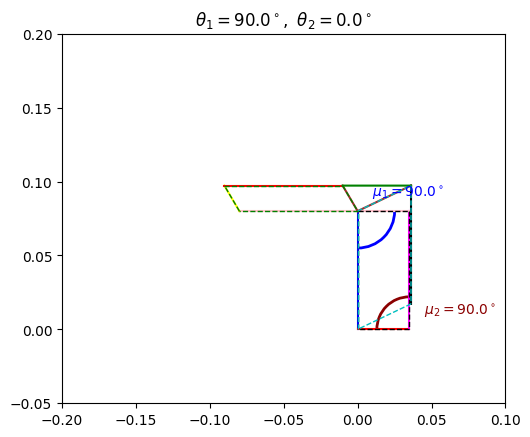

In [423]:
import matplotlib.animation as animation

fig, ax = plt.subplots()

def update(i):
    ax.clear()

    theta1_val = theta1_vals[i]
    theta2_val = theta2_vals[i]
    theta_u_val = theta_u_hist[i]

    joint_values = [
        theta1_val,
        theta2_val,
        *theta_u_val
    ]

    plotMechanismTrans4(joint_values, ax)

    ax.set_title(
        rf"$\theta_1={np.rad2deg(theta1_val):.1f}^\circ,\ "
        rf"\theta_2={np.rad2deg(theta2_val):.1f}^\circ$"
    )

anim = animation.FuncAnimation(
    fig,
    update,
    frames=len(tList),
    interval=80,
    repeat=False,
)

In [424]:
# Imprimir animación en el notebook
HTML(anim.to_jshtml())

# Links de las otras animaciones

¡Aquí está la Animación 1 (la más interesante)!

https://github.com/LuigiToby/IMEC2543/blob/main/talleres/taller1/animacion1.gif

y la animación2

https://github.com/LuigiToby/IMEC2543/blob/main/talleres/taller1/animacion2.gif


In [ ]:
#Esto es para guardarlo en .gif
# anim.save("animacion2.gif", writer="pillow", fps=15)

In [ ]:
# Esto es para guardarlo en .mp4
# anim.save("animacion2.mp4", writer="ffmpeg",fps=30)

# Paso 2 - Dinámica Inversa
En dinámica las incognitas son los momentos y fuerzas, por la cantidad de cuerpos (4) podemos entonces encontar 12 ecuaciones en el sistema, las cuales tenemos que escribir.

In [386]:
points={'A': 0*T.x, 'B': rAB, 'C': rAC, 'D': rAC+rCD, 'E': rAE, 'F': rAE+rEF, 'G': rAB+rBG, 'H': rAB-rIB+rIH, 'I': rAB-rIB}

com = {'J': rAB/2,

    'K': rAC/2,
    'L': rAC+(rCD/2),
    'M': rAE+(rEF/2), 
    'N': rAB+(rBF/3)+(rBG/3),
    'O': rAB-rIB+rIH+(rHG/2),
    'P': rAC+rCD+(-(rBD+rIB)/2),
    'Q': rAB-rIB+(rIH/2),
    }

com_fun = {

    k: lambdify(

        [theta1,theta2,theta3,theta4,theta5,theta6,theta7,theta8],

        [v.dot(T.x).subs(params), v.dot(T.y).subs(params)],

        modules="numpy"

    )

    for k, v in com.items()

}

In [387]:
def plotMechanismCOM(joint_values, ax=None, show_labels=True):
    plotMechanism(joint_values, ax)
    if ax is None:
        ax = plt.gca()
    for name, f in com_fun.items():
        x, y = f(*joint_values)
        ax.plot(x, y, 'ko', markersize=5) # punto negro
        if show_labels:
            ax.text(
                x + 0.003,
                y + 0.003,
                f'COM {name}',
                fontsize=8,
                color='black'
            )

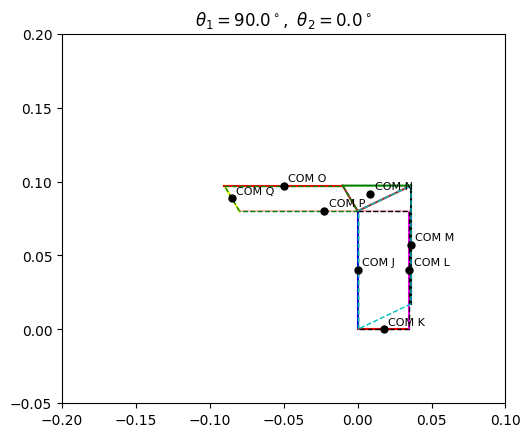

In [388]:
fig, ax = plt.subplots()

def update(i):
    ax.clear()
    theta1_val = theta1_vals[i]
    theta2_val = theta2_vals[i]
    theta_u_val = theta_u_hist[i]
    joint_values = [
        theta1_val,
        theta2_val,
        *theta_u_val
    ]
    plotMechanismCOM(joint_values, ax)
    ax.set_title(
        rf"$\theta_1={np.rad2deg(theta1_val):.1f}^\circ,\ "
        rf"\theta_2={np.rad2deg(theta2_val):.1f}^\circ$"
    )
anim = animation.FuncAnimation(
    fig,
    update,
    frames=len(tList),
    interval=80,
    repeat=False
)

In [389]:
acc = {
    k: v.diff(t, T).diff(t, T)
    for k, v in com.items()
}

weights = {
    'J': -mJ*g*T.y,
    'K': -mK*g*T.y,
    'L': -mL*g*T.y,
    'M': -mM*g*T.y,
    'N': -mN*g*T.y,
    'O': -mO*g*T.y,
    'P': -mP*g*T.y,
    'Q': -mQ*g*T.y
}


inertia_G = {
    'J': (1/12)*mJ*l2**2,
    'K': (1/12)*mK*l1**2,
    'L': (1/12)*mL*l3**2,
    'M': (1/12)*mM*l3**2,
    'N': (1/18)*mN*(l6**2 + l7**2),
    'O': (1/12)*mO*l3**2,
    'P': (1/12)*mP*(l3+l4)**2,
    'Q': (1/12)*mQ*l5**2
}

alpha = {
    'J': J.ang_acc_in(T).dot(T.z),
    'K': K.ang_acc_in(T).dot(T.z),
    'L': L.ang_acc_in(T).dot(T.z),
    'M': M.ang_acc_in(T).dot(T.z),
    'N': N.ang_acc_in(T).dot(T.z),
    'O': O.ang_acc_in(T).dot(T.z),
    'P': P.ang_acc_in(T).dot(T.z),
    'Q': Q.ang_acc_in(T).dot(T.z)
}



In [390]:
# Fuerzas expresadas en el marco T

FTJ = F_TJx*T.x + F_TJy*T.y
FTK = F_TKx*T.x + F_TKy*T.y
FKL = F_KLx*T.x + F_KLy*T.y
FTM = F_TMx*T.x + F_TMy*T.y

FNO = F_NOx*T.x + F_NOy*T.y
FOQ = F_OQx*T.x + F_OQy*T.y

FQP = F_QPx*T.x + F_QPy*T.y
FJP = F_JPx*T.x + F_JPy*T.y
FLP = F_LPx*T.x + F_LPy*T.y

FJN = F_JNx*T.x + F_JNy*T.y
FMN = F_MNx*T.x + F_MNy*T.y



In [391]:
# CUERPO J
r_GJ_A = points['A'] - com['J']
r_GJ_B = points['B'] - com['J']

# CUERPO K
r_GK_A = points['A'] - com['K']
r_GK_C = points['C'] - com['K']

# CUERPO L
r_GL_C = points['C'] - com['L']
r_GL_D = points['D'] - com['L']

# CUERPO M
r_GM_E = points['E'] - com['M']
r_GM_F = points['F'] - com['M']

# CUERPO N
r_GN_B = points['B'] - com['N']
r_GN_F = points['F'] - com['N']
r_GN_G = points['G'] - com['N']

# CUERPO O
r_GO_H = points['H'] - com['O']
r_GO_G = points['G'] - com['O']

# CUERPO P
r_GP_D = points['D'] - com['P']
r_GP_B = points['B'] - com['P']
r_GP_I = points['I'] - com['P']

# CUERPO Q
r_GQ_I = points['I'] - com['Q']
r_GQ_H = points['H'] - com['Q']

In [392]:
# CUERPO J
eqFJx = (+ F_TJx - F_JPx - F_JNx) - mJ*acc['J'].dot(T.x)
eqFJy = ( + F_TJy - F_JPy - F_JNy + weights['J'].dot(T.y) ) - mJ*acc['J'].dot(T.y)
eqMJ = (
    + M_in1
    + r_GJ_A.cross(FTJ).dot(T.z)
    + r_GJ_B.cross(-FJN).dot(T.z)
    + r_GJ_B.cross(-FJP).dot(T.z)
) - inertia_G['J']*alpha['J']
# CUERPO K
eqFKx = ( + F_TKx - F_KLx ) - mK*acc['K'].dot(T.x)
eqFKy = ( + F_TKy - F_KLy + weights['K'].dot(T.y) ) - mK*acc['K'].dot(T.y)
eqMK = (
    + M_in2
    + r_GK_A.cross(FTK).dot(T.z)
    + r_GK_C.cross(-FKL).dot(T.z)
) - inertia_G['K']*alpha['K']
# CUERPO L
eqFLx = ( + F_KLx - F_LPx ) - mL*acc['L'].dot(T.x)
eqFLy = ( + F_KLy - F_LPy + weights['L'].dot(T.y) ) - mL*acc['L'].dot(T.y)
eqML = (
    + r_GL_D.cross(-FLP).dot(T.z)
    + r_GL_C.cross(FKL).dot(T.z)
) - inertia_G['L']*alpha['L']
# CUERPO M
eqFMx = ( + F_TMx - F_MNx ) - mM*acc['M'].dot(T.x)
eqFMy = ( + F_TMy - F_MNy + weights['M'].dot(T.y) ) - mM*acc['M'].dot(T.y)
eqMM = (
    + r_GM_E.cross(FTM).dot(T.z)
    + r_GM_F.cross(-FMN).dot(T.z)
) - inertia_G['M']*alpha['M']
# CUERPO N
eqFNx = ( + F_JNx + F_MNx - F_NOx ) - mN*acc['N'].dot(T.x)
eqFNy = ( + F_JNy + F_MNy - F_NOy + weights['N'].dot(T.y) ) - mN*acc['N'].dot(T.y)
eqMN = (
    + r_GN_G.cross(-FNO).dot(T.z)
    + r_GN_F.cross(FMN).dot(T.z)
    + r_GN_B.cross(FJN).dot(T.z)
) - inertia_G['N']*alpha['N']
# CUERPO O
eqFOx = ( + F_NOx - F_OQx ) - mO*acc['O'].dot(T.x)
eqFOy = ( + F_NOy - F_OQy + weights['O'].dot(T.y) ) - mO*acc['O'].dot(T.y)
eqMO = (
    + r_GO_G.cross(FNO).dot(T.z)
    + r_GO_H.cross(-FOQ).dot(T.z)
) - inertia_G['O']*alpha['O']
# CUERPO P
eqFPx = ( + F_QPx + F_JPx + F_LPx ) - mP*acc['P'].dot(T.x)
eqFPy = ( + F_QPy + F_JPy + F_LPy + weights['P'].dot(T.y) ) - mP*acc['P'].dot(T.y)
eqMP = (
    + r_GP_I.cross(FQP).dot(T.z)
    + r_GP_B.cross(FJP).dot(T.z)
    + r_GP_D.cross(FLP).dot(T.z)
) - inertia_G['P']*alpha['P']
# CUERPO Q
eqFQx = ( + F_OQx - F_QPx ) - mQ*acc['Q'].dot(T.x)
eqFQy = ( + F_OQy - F_QPy + weights['Q'].dot(T.y) ) - mQ*acc['Q'].dot(T.y)
eqMQ = (
    + r_GQ_H.cross(FOQ).dot(T.z)
    + r_GQ_I.cross(-FQP).dot(T.z)
) - inertia_G['Q']*alpha['Q']

In [393]:
eqList = [

    # --- CUERPO J ---
    eqFJx, eqFJy, eqMJ,

    # --- CUERPO K ---
    eqFKx, eqFKy, eqMK,

    # --- CUERPO L ---
    eqFLx, eqFLy, eqML,

    # --- CUERPO M ---
    eqFMx, eqFMy, eqMM,

    # --- CUERPO N ---
    eqFNx, eqFNy, eqMN,

    # --- CUERPO O ---
    eqFOx, eqFOy, eqMO,

    # --- CUERPO P ---
    eqFPx, eqFPy, eqMP,

    # --- CUERPO Q ---
    eqFQx, eqFQy, eqMQ,
]

In [394]:
unknowns = [

    # Fuerzas TJ
    F_TJx, F_TJy,

    # Fuerzas JP
    F_JPx, F_JPy,

    # Fuerzas JN
    F_JNx, F_JNy,

    # Fuerzas TK
    F_TKx, F_TKy,

    # Fuerzas KL
    F_KLx, F_KLy,

    # Fuerzas LP
    F_LPx, F_LPy,

    # Fuerzas TM
    F_TMx, F_TMy,

    # Fuerzas MN
    F_MNx, F_MNy,

    # Fuerzas NO
    F_NOx, F_NOy,

    # Fuerzas OQ
    F_OQx, F_OQy,

    # Fuerzas QP
    F_QPx, F_QPy,

    # Momentos externos
    M_in1, M_in2
]

In [395]:
display(len(eqList))
display(len(unknowns))

24

24

In [396]:
FF, bf = linear_eq_to_matrix(eqList, unknowns)

In [397]:
FF.subs(params)

Matrix([
[                  1,                    0,                                                                                        -1,                                                                                        0,                                                                                                                           -1,                                                                                                                           0,                     0,                      0,                     0,                      0,                      0,                     0,                   0,                    0,                                                                                                                                                                                 0,                                                                                                                                                         

In [398]:
bf.subs(params)

Matrix([
[                                                                                                                                                                                                                                                                                                                                                                                                     -0.000564*sin(theta1(t))*Derivative(theta1(t), (t, 2)) - 0.000564*cos(theta1(t))*Derivative(theta1(t), t)**2],
[                                                                                                                                                                                                                                                                                                                                                                                          -0.000564*sin(theta1(t))*Derivative(theta1(t), t)**2 + 0.000564*cos(theta1(t))*Derivative(theta1(t), (t, 2)) + 

In [399]:
FF.shape, bf.shape


((24, 24), (24, 1))

In [400]:
dyn_vars = [
    theta1, theta2, theta3, theta4,
    theta5, theta6, theta7, theta8,
    theta1.diff(t), theta2.diff(t), theta3.diff(t), theta4.diff(t),
    theta5.diff(t), theta6.diff(t), theta7.diff(t), theta8.diff(t),
    theta1.diff(t,2), theta2.diff(t,2), theta3.diff(t,2), theta4.diff(t,2),
    theta5.diff(t,2), theta6.diff(t,2), theta7.diff(t,2), theta8.diff(t,2)
]


In [401]:
FF_fun = lambdify(
    dyn_vars,
    FF.subs(params),
    modules="numpy"
)

bf_fun = lambdify(
    dyn_vars,
    bf.subs(params),
    modules="numpy"
)

# Paso 2.1 Sidequest para levantar FK, FV y FA

## FV

In [402]:
eqLoop1_v = eqLoop1.diff(t, T)
eqLoop2_v = eqLoop2.diff(t, T)
eqLoop3_v = eqLoop3.diff(t, T)

eqs_v = [
    eqLoop1_v.dot(T.x), eqLoop1_v.dot(T.y),
    eqLoop2_v.dot(T.x), eqLoop2_v.dot(T.y),
    eqLoop3_v.dot(T.x), eqLoop3_v.dot(T.y),
]

eqs_v_fun = lambdify(
    (
        theta1, theta2, theta3, theta4, theta5, theta6, theta7, theta8,
        theta1.diff(t), theta2.diff(t),
        theta3.diff(t), theta4.diff(t), theta5.diff(t),
        theta6.diff(t), theta7.diff(t), theta8.diff(t)
    ),
    eqs_v,
    'numpy'
)

In [403]:
def FV(theta_vals, theta_dot_known, guess):
    """
    Resuelve velocidades desconocidas theta_dot_u
    """

    theta1_val, theta2_val = theta_vals[:2]
    theta_u_vals = theta_vals[2:]

    theta1_dot, theta2_dot = theta_dot_known

    def residual(theta_dot_u):
        theta3_dot, theta4_dot, theta5_dot, theta6_dot, theta7_dot, theta8_dot = theta_dot_u

        r = eqs_v_fun(
            theta1_val, theta2_val, *theta_u_vals,
            theta1_dot, theta2_dot,
            theta3_dot, theta4_dot, theta5_dot,
            theta6_dot, theta7_dot, theta8_dot
        )
        return np.array(r, dtype=float)

    def cost(theta_dot_u):
        r = residual(theta_dot_u)
        return np.dot(r, r)

    result = minimize(cost, x0=guess, method='BFGS')

    if not result.success:
        raise RuntimeError("FV no convergió")

    return result.x

In [404]:
theta_dot_u_hist = []

theta_dot_u0 = np.zeros(6)   # buena práctica empezar en cero

for i in range(len(tList)):

    theta_vals = [
        theta1_vals[i],
        theta2_vals[i],
        *theta_u_hist[i]
    ]

    theta_dot_known = [
        theta1_dot_vals[i],
        theta2_dot_vals[i]
    ]

    theta_dot_u_sol = FV(
        theta_vals,
        theta_dot_known,
        theta_dot_u0
    )

    theta_dot_u_hist.append(theta_dot_u_sol)
    theta_dot_u0 = theta_dot_u_sol   # continuation 🔑

In [405]:
np.max(np.abs(theta_dot_u_hist))

np.float64(0.3653884555652061)

## FA

In [406]:
eqLoop1_a = eqLoop1_v.diff(t, T)
eqLoop2_a = eqLoop2_v.diff(t, T)
eqLoop3_a = eqLoop3_v.diff(t, T)

eqs_a = [
    eqLoop1_a.dot(T.x), eqLoop1_a.dot(T.y),
    eqLoop2_a.dot(T.x), eqLoop2_a.dot(T.y),
    eqLoop3_a.dot(T.x), eqLoop3_a.dot(T.y),
]

eqs_a_fun = lambdify(
    (
        theta1, theta2, theta3, theta4, theta5, theta6, theta7, theta8,
        theta1.diff(t), theta2.diff(t),
        theta3.diff(t), theta4.diff(t), theta5.diff(t),
        theta6.diff(t), theta7.diff(t), theta8.diff(t),
        theta1.diff(t,2), theta2.diff(t,2),
        theta3.diff(t,2), theta4.diff(t,2), theta5.diff(t,2),
        theta6.diff(t,2), theta7.diff(t,2), theta8.diff(t,2)
    ),
    eqs_a,
    'numpy'
)

In [407]:
def FA(theta_vals, theta_dot_vals, theta_ddot_known, guess):
    """
    Resuelve aceleraciones desconocidas
    """

    theta1_val, theta2_val = theta_vals[:2]
    theta_u_vals = theta_vals[2:]

    theta1_dot, theta2_dot = theta_dot_vals[:2]
    theta_u_dot = theta_dot_vals[2:]

    theta1_ddot, theta2_ddot = theta_ddot_known

    def residual(theta_ddot_u):
        r = eqs_a_fun(
            theta1_val, theta2_val, *theta_u_vals,
            theta1_dot, theta2_dot, *theta_u_dot,
            theta1_ddot, theta2_ddot, *theta_ddot_u
        )
        return np.array(r, dtype=float)

    def cost(theta_ddot_u):
        r = residual(theta_ddot_u)
        return np.dot(r, r)

    result = minimize(cost, x0=guess, method='BFGS')

    if not result.success:
        raise RuntimeError("FA no convergió")

    return result.x

In [408]:
theta_u_hist      = []
theta_dot_u_hist  = []
theta_ddot_u_hist = []

theta_u0      = np.deg2rad([80, 60, 0, 30, 30, 90])
theta_dot_u0  = np.zeros(6)
theta_ddot_u0 = np.zeros(6)

for i, ti in enumerate(tList):

    # --- entradas conocidas ---
    theta1_val      = theta1_fun(ti)
    theta2_val      = theta2_fun(ti)
    theta1_dot_val  = theta1_dot_fun(ti)
    theta2_dot_val  = theta2_dot_fun(ti)
    theta1_ddot_val = theta1_ddot_fun(ti)
    theta2_ddot_val = theta2_ddot_fun(ti)

    # --- FK ---
    theta_u = FK(theta1_val, theta2_val, theta_u0)
    theta_vals = [theta1_val, theta2_val, *theta_u]

    # --- FV ---
    theta_dot_u = FV(
        theta_vals,
        [theta1_dot_val, theta2_dot_val],
        theta_dot_u0
    )
    theta_dot_vals = [theta1_dot_val, theta2_dot_val, *theta_dot_u]

    # --- FA ---
    theta_ddot_u = FA(
        theta_vals,
        theta_dot_vals,
        [theta1_ddot_val, theta2_ddot_val],
        theta_ddot_u0
    )

    # --- guardar ---
    theta_u_hist.append(theta_u)
    theta_dot_u_hist.append(theta_dot_u)
    theta_ddot_u_hist.append(theta_ddot_u)

    # --- continuation ---
    theta_u0      = theta_u
    theta_dot_u0  = theta_dot_u
    theta_ddot_u0 = theta_ddot_u

Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 58
         Function evaluations: 427
         Gradient evaluations: 61
Convergió.
Costo final: 3.0210613693857883e-16
Norma residual: 1.738120067597687e-08
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 51
         Function evaluations: 392
         Gradient evaluations: 56
Convergió.
Costo final: 2.9019978965478755e-15
Norma residual: 5.387019488128733e-08
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 50
         Function evaluations: 385
         Gradient evaluations: 55
Convergió.
Costo final: 7.180429605432205e-14
Norma residual: 2.679632363857439e-07
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 50
         Function evaluations: 385
         Gradient evaluations: 55
Convergió.
Costo final: 6.90146492029392e-14
Norma res

In [409]:
np.max(np.abs(theta_u_hist))

np.float64(2.103412764352872)

In [410]:
theta_vals = np.array([theta1_val, theta2_val, *theta_u])
theta_dot_vals = np.array([theta1_dot_val, theta2_dot_val, *theta_dot_u])
theta_ddot_vals = np.array([theta1_ddot_val, theta2_ddot_val, *theta_ddot_u])

dyn_input = [
    *theta_vals,
    *theta_dot_vals,
    *theta_ddot_vals
]

In [411]:
forces_hist = []

for i, ti in enumerate(tList):

    # --- entradas conocidas ---
    theta1_val      = theta1_fun(ti)
    theta2_val      = theta2_fun(ti)
    theta1_dot_val  = theta1_dot_fun(ti)
    theta2_dot_val  = theta2_dot_fun(ti)
    theta1_ddot_val = theta1_ddot_fun(ti)
    theta2_ddot_val = theta2_ddot_fun(ti)

    # --- FK ---
    theta_u = FK(theta1_val, theta2_val, theta_u0)
    theta_vals = np.array([theta1_val, theta2_val, *theta_u])

    # --- FV ---
    theta_dot_u = FV(
        theta_vals,
        [theta1_dot_val, theta2_dot_val],
        theta_dot_u0
    )
    theta_dot_vals = np.array([theta1_dot_val, theta2_dot_val, *theta_dot_u])

    # --- FA ---
    theta_ddot_u = FA(
        theta_vals,
        theta_dot_vals,
        [theta1_ddot_val, theta2_ddot_val],
        theta_ddot_u0
    )
    theta_ddot_vals = np.array([theta1_ddot_val, theta2_ddot_val, *theta_ddot_u])

    # --- dinámica ---
    dyn_input = [
        *theta_vals,
        *theta_dot_vals,
        *theta_ddot_vals
    ]

    FF_eval = np.array(FF_fun(*dyn_input), dtype=float)
    bf_eval = np.array(bf_fun(*dyn_input), dtype=float)

    lambda_sol = np.linalg.solve(FF_eval, bf_eval)
    lambda_sol = np.array(lambda_sol).flatten() # Flatten para que sean normales
    forces_hist.append(lambda_sol)

    # --- continuation ---
    theta_u0      = theta_u
    theta_dot_u0  = theta_dot_u
    theta_ddot_u0 = theta_ddot_u

Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 51
         Function evaluations: 392
         Gradient evaluations: 56
Convergió.
Costo final: 5.850012400677722e-14
Norma residual: 2.418679888012823e-07
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 51
         Function evaluations: 392
         Gradient evaluations: 56
Convergió.
Costo final: 2.9435848946712334e-15
Norma residual: 5.425481448379704e-08
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 50
         Function evaluations: 385
         Gradient evaluations: 55
Convergió.
Costo final: 7.17828138024956e-14
Norma residual: 2.679231490605013e-07
Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 50
         Function evaluations: 385
         Gradient evaluations: 55
Convergió.
Costo final: 6.90143123449367e-14
Norma resid

In [412]:
forces_hist = np.array(forces_hist)
forces_hist.shape

(120, 24)

In [413]:
forces_dict = {}

for j, var in enumerate(unknowns):
    forces_dict[str(var)] = forces_hist[:, j]

In [414]:
print(forces_dict.keys())

dict_keys(['F_TJx', 'F_TJy', 'F_JPx', 'F_JPy', 'F_JNx', 'F_JNy', 'F_TKx', 'F_TKy', 'F_KLx', 'F_KLy', 'F_LPx', 'F_LPy', 'F_TMx', 'F_TMy', 'F_MNx', 'F_MNy', 'F_NOx', 'F_NOy', 'F_OQx', 'F_OQy', 'F_QPx', 'F_QPy', 'M_in1', 'M_in2'])


In [415]:
forces_dict['M_in1'][0]

np.float64(-7.162398814856961e-08)

In [416]:
forces_hist[0][unknowns.index(M_in1)]

np.float64(-7.162398814856961e-08)

In [417]:
force_names = list(forces_dict.keys())

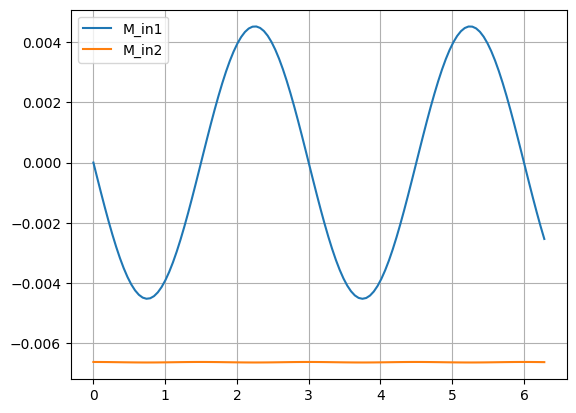

In [418]:
plt.figure()
plt.plot(tList, forces_dict['M_in1'], label='M_in1')
plt.plot(tList, forces_dict['M_in2'], label='M_in2')
plt.legend()
plt.grid()
plt.show()

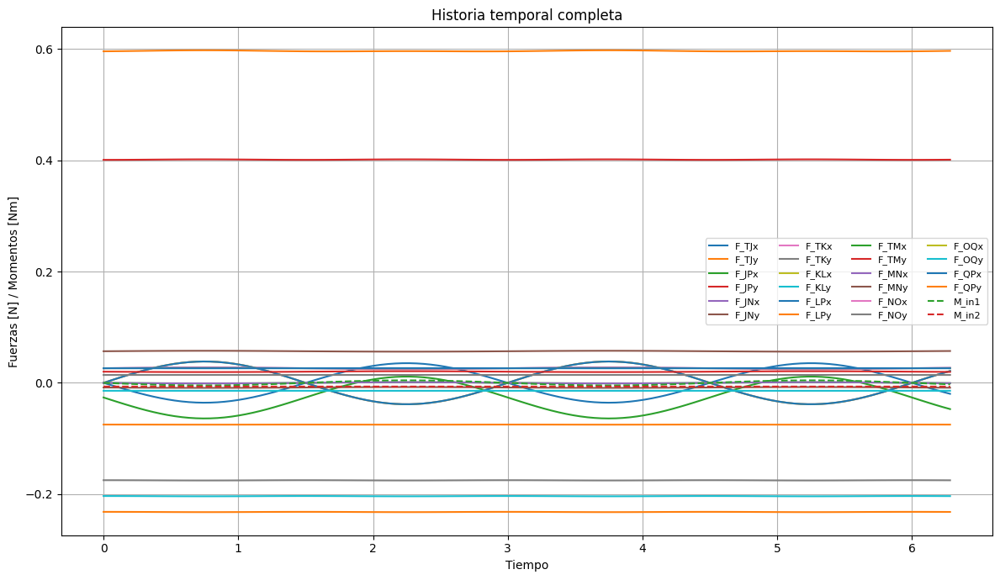

In [419]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,7))

for name, values in forces_dict.items():
    
    if name.startswith("M"):      # momentos
        plt.plot(tList, values, '--', label=name)
    else:                         # fuerzas
        plt.plot(tList, values, '-', label=name)

plt.xlabel("Tiempo")
plt.ylabel("Fuerzas [N] / Momentos [Nm]")
plt.title("Historia temporal completa")
plt.legend(ncol=4, fontsize=8)
plt.grid(True)
plt.tight_layout()
plt.show()

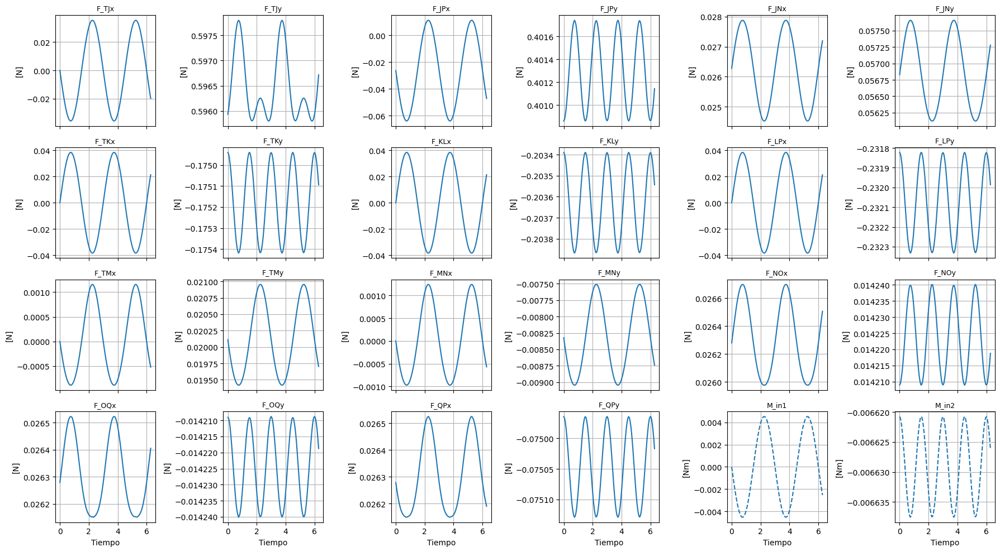

In [420]:
fig, axes = plt.subplots(4, 6, figsize=(18,10), sharex=True)
axes = axes.flatten()

for i, name in enumerate(force_names):

    ax = axes[i]
    values = forces_dict[name]

    if name.startswith("M"):
        ax.plot(tList, values, '--')
        ax.set_ylabel("[Nm]")
    else:
        ax.plot(tList, values, '-')
        ax.set_ylabel("[N]")

    ax.set_title(name, fontsize=9)
    ax.grid(True)

# Etiqueta común abajo
for ax in axes[-6:]:
    ax.set_xlabel("Tiempo")

plt.tight_layout()
plt.show()

### Imagenes y resultados de la animación1
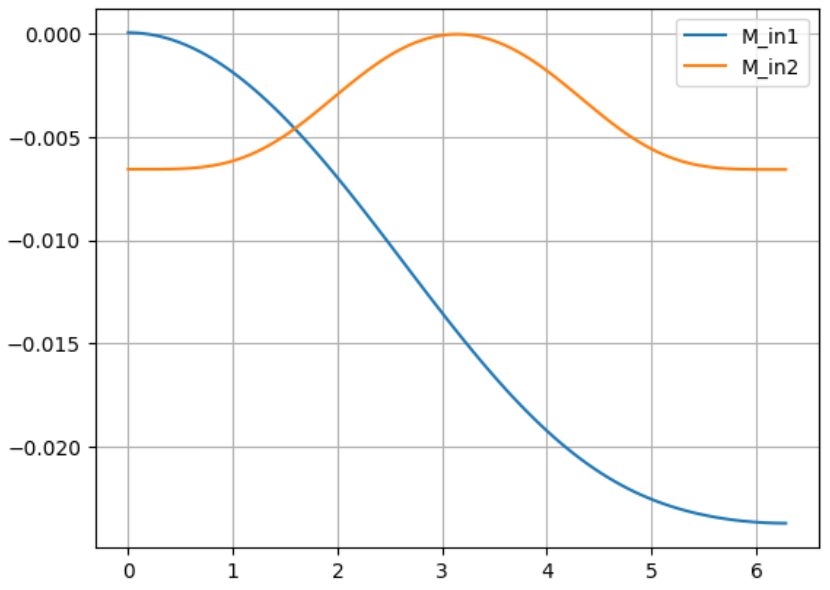
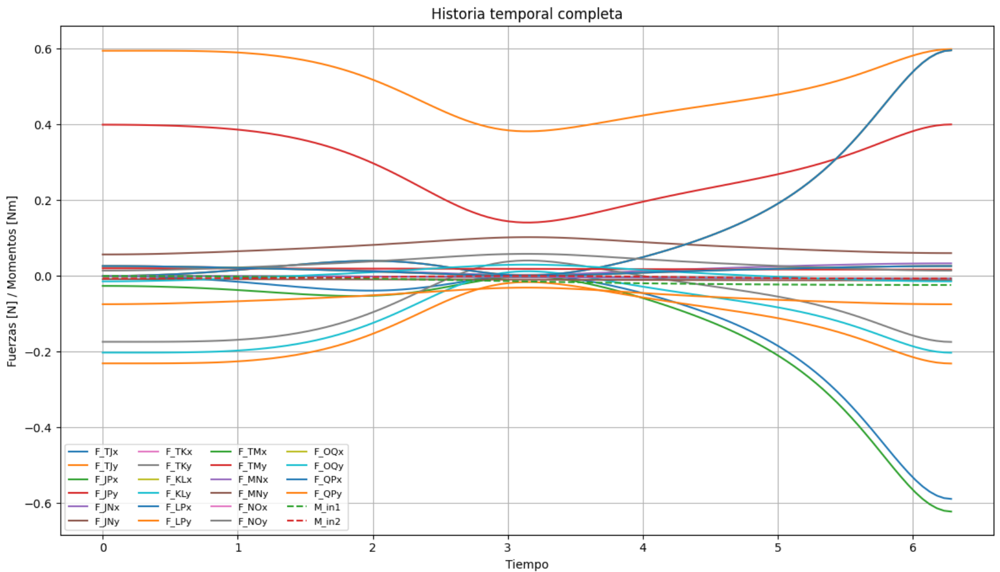
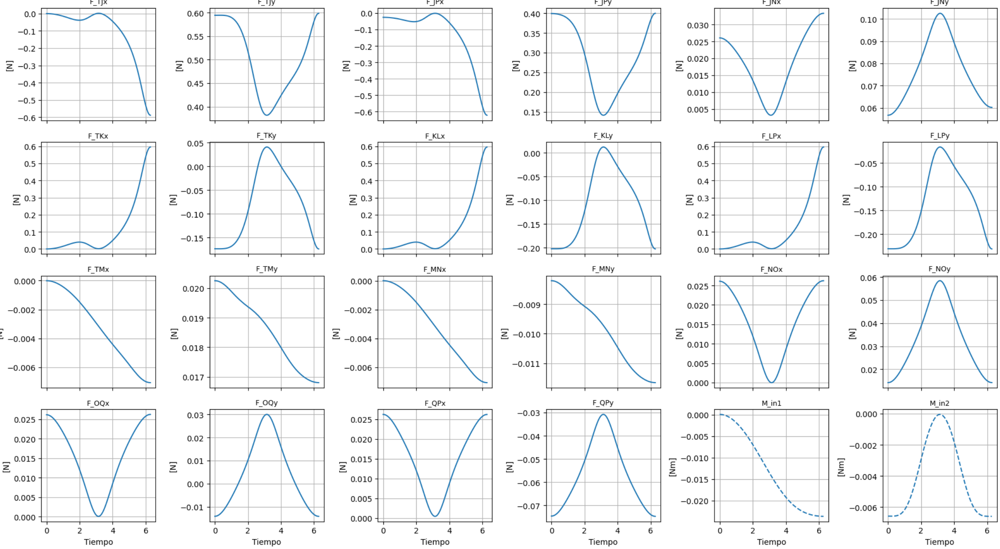

# Conclusiones

El modelo desarrollado cumple con los objetivos planteados en el taller, integrando de manera consistente la cinemática directa, el análisis de velocidades y aceleraciones, y la dinámica inversa del mecanismo completo del EEZYbotARM.

Desde el punto de vista cinemático, el cierre geométrico del mecanismo se verificó numéricamente a lo largo de todo el ciclo de movimiento. La norma del residual de los lazos se mantuvo cercana a cero en todos los instantes evaluados, lo que confirma que la solución obtenida satisface las ecuaciones de restricción:

$$
|\mathbf{r}_{loop}| \approx 0
$$

Esto demuestra que el procedimiento de minimización empleado para resolver la cinemática directa es consistente y estable bajo continuación temporal.

En términos dinámicos, el sistema de ecuaciones fue formulado a partir de los diagramas de cuerpo libre individuales, aplicando segunda ley de Newton en forma traslacional y rotacional:

$$
\sum \mathbf{F} = m \mathbf{a}_G
$$

$$
\sum M_G = I_G \alpha
$$

La matriz dinámica obtenida es cuadrada y resoluble en cada instante mediante:

$$
\mathbf{F}\lambda = \mathbf{b}
$$

y se verificó que el sistema puede resolverse sin singularidades en el rango de movimiento analizado. La evolución temporal de los momentos de entrada $M_{in1}$ y $M_{in2}$ presenta un comportamiento suave y periódico, coherente con las trayectorias sinusoidales impuestas en las entradas. En particular:

* Cuando el movimiento impuesto es sinusoidal, los momentos obtenidos presentan la misma periodicidad.
* Cuando uno de los grados de libertad permanece fijo (Animación 2), el momento asociado al grado activo presenta una forma aproximadamente sinusoidal, lo cual es físicamente consistente con la aceleración angular impuesta.
* No se observan saltos numéricos ni discontinuidades, lo que indica estabilidad en la solución.

Estos resultados validan que el modelo dinámico responde correctamente a las excitaciones impuestas y que las simplificaciones adoptadas no introducen comportamientos no físicos.

## Aspectos que pueden mejorarse

1. **Modelado inercial más preciso:**
   Aunque se justificó la aproximación de centros de masa y momentos de inercia mediante modelos de barras delgadas, podría realizarse un cálculo más detallado considerando distribución real de masa del impreso 3D.

2. **Optimización del método numérico:**
   Actualmente la cinemática, velocidades y aceleraciones se resuelven mediante minimización con BFGS. Podría implementarse un método más eficiente utilizando la formulación matricial directa del Jacobiano para reducir costo computacional.

3. **Análisis de condición numérica:**
   Un estudio más profundo del número de condición de la matriz dinámica permitiría evaluar sensibilidad ante perturbaciones.

4. **Inclusión de fricción y efectos disipativos:**
   El modelo desprecia fricción. Incorporarla permitiría comparar con un comportamiento experimental real.

## Key Takeaways

* El uso de ángulos globales simplifica significativamente la formulación cinemática y dinámica, evitando ambigüedades en la diferenciación temporal.
* La verificación explícita del cierre de lazos es fundamental antes de proceder al análisis dinámico.
* La coherencia física de los momentos obtenidos (suavidad, periodicidad y ausencia de discontinuidades) es un fuerte indicador de consistencia del modelo.
* La impresión 3D introduce incertidumbre real en propiedades inerciales; modelar con criterio ingenieril es más importante que sobreajustar parámetros inciertos.
* La dinámica inversa es extremadamente sensible a errores en aceleraciones; por ello la correcta implementación de FK, FV y FA es crítica.

En conclusión, el modelo desarrollado es consistente, estable y físicamente coherente dentro de las hipótesis adoptadas. Las simplificaciones realizadas fueron justificadas técnicamente y no comprometen la validez cualitativa ni cuantitativa de los resultados obtenidos en el rango de operación estudiado.
